In [1]:
import pydataset
import numpy as np
import pandas as pd
from scipy import linalg as la
from mpl_toolkits import mplot3d
from matplotlib import pyplot as plt

In [2]:
plt.rcParams["figure.dpi"] = 300
plt.rcParams["text.usetex"] = True

<h1><center>Diffusion maps, spectral clustering and reaction coordinates of dynamical systems</center></h1>
<center>Paper by
Boaz Nadler,
Stéphane Lafon,
Ronald R. Coifmanm, and
Ioannis G. Kevrekidis
</center>
<center>Presented by
Shane McQuarrie
</center>
<center>
CSE 392: SCIENTIF COMP MACH/DEEP LRN
</center>
<center>
15 November 2019
</center>

## Random Walks and Diffusion

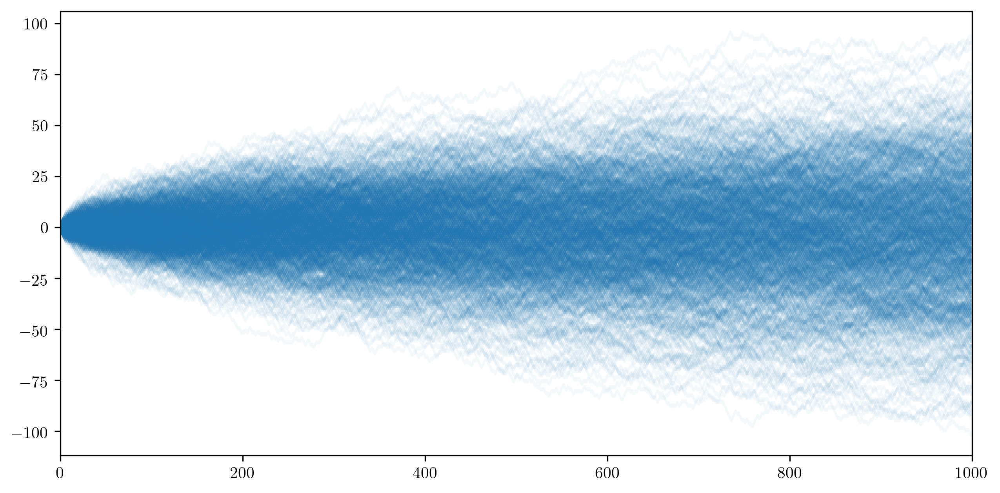

In [3]:
# Generate a lot of random walks, where the step is 1 or -1.
paths = np.cumsum(np.random.randint(0, 2, (1000,1000))*2 - 1, axis=1)

fig, ax = plt.subplots(1, 1, figsize=(10,5))
ax.plot(paths.T, color="C0", alpha=.05)
ax.set_xlim(0, 1000)
plt.show()

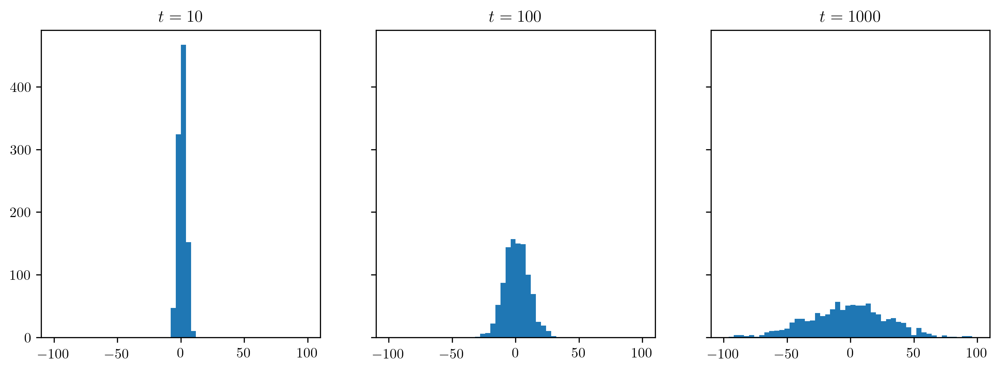

In [4]:
fig, axes = plt.subplots(1, 3, figsize=(12,4),
                         sharex=True, sharey=True)
for j, ax in zip([10, 100, 1000], axes):
    ax.hist(paths[:,j-1], bins=50, range=(-100,100))
    ax.set_title(fr"$t = {j}$")
plt.show()

## Diffusion on Discrete Markov Chains

In [5]:
def markov_transition_matrix(X, k, **kwargs):
    """Construct the (row-stochastic) Markov transition matrix
    corresponding to k(X,X).
    
    Parameters
    ----------
    X : (m,n) ndarray
        Data, organized so that each row is a point.
    
    k : func(x,y) -> float
        Kernel function from which to construct the distances.
        This construction assumes that k(x,x) = 0.
    """
    m,n = X.shape
    G = np.zeros((m,m))
    for i in range(m):
        for j in range(i+1,m):
            G[i,j] = k(X[i], X[j], **kwargs)
    G = G + G.T
    return G / G.sum(axis=1).reshape((-1,1))

In [6]:
def gaussian_kernel(x, y, eps=.7):
    return np.exp(-np.sum((x - y)**2) / eps)

In [7]:
# Make some labeled test data.
X = np.vstack([
    np.random.normal(loc=np.array([-1.25, 0]), scale=.4, size=(300,2)),
    np.random.normal(loc=np.array([1, -1]),    scale=.4, size=(300,2)),
    np.random.normal(loc=np.array([1, .75]),   scale=.4, size=(300,2))
])
y = np.concatenate([
    np.zeros(300),
    np.ones(300),
    np.full(300, 2)
])
X.shape

(900, 2)

In [8]:
M = markov_transition_matrix(X, gaussian_kernel, eps=.7)
M.shape

(900, 900)

In [9]:
x = np.zeros(len(X))
x[100] = 1

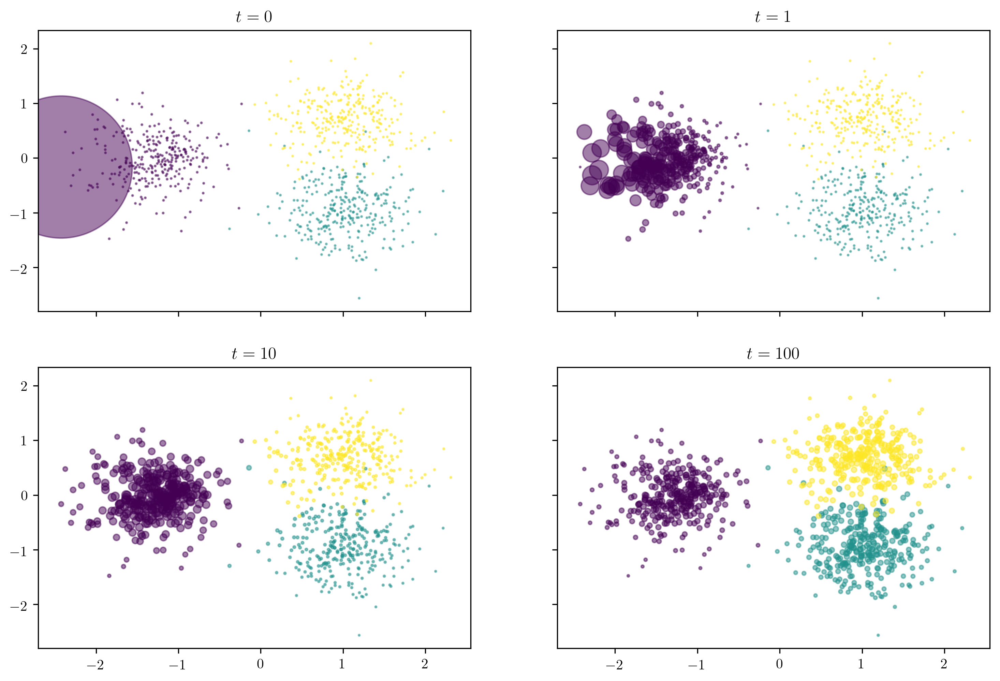

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(12,8),
                         sharex=True, sharey=True)
for p, ax in zip([0, 1, 10, 100], axes.flatten()):
    Mp = np.linalg.matrix_power(M, p)
    xn = Mp.T @ x
    ax.scatter(X[:,0], X[:,1], s=(xn*10000)+1, c=y, alpha=.5)
    ax.set_title(rf"$t = {p}$")
plt.show()

In [11]:
def plot_cluster_blocks(X, y, M, powers):
    fig1, ax = plt.subplots(1, 1, figsize=(12,4))
    ax.scatter(X[:,0], X[:,1], s=4, c=y)
    ax.set_title("data")
    
    fig2, axes = plt.subplots(1, len(powers), figsize=(12,4), sharex=True, sharey=True)
    for ax,power in zip(axes, powers):
        Mn = np.linalg.matrix_power(M, power)
        ax.set_aspect("equal")
        ax.imshow(Mn, vmin=0, vmax=Mn.max())
        ax.set_title(fr"$t = {power}$")
    fig2.tight_layout()

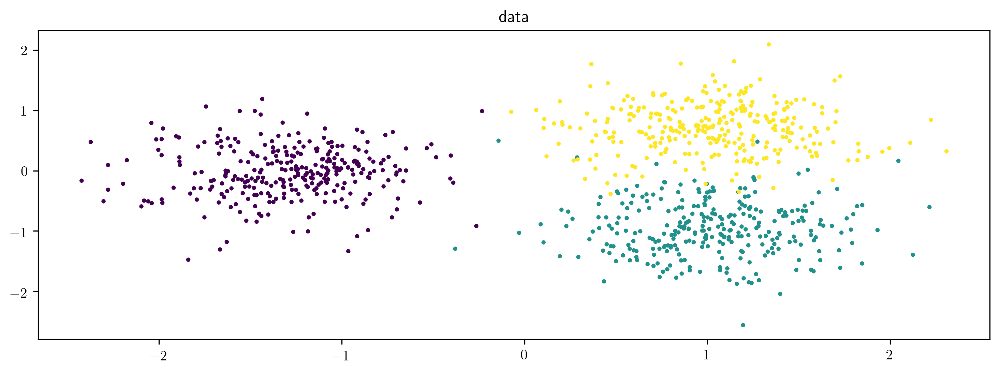

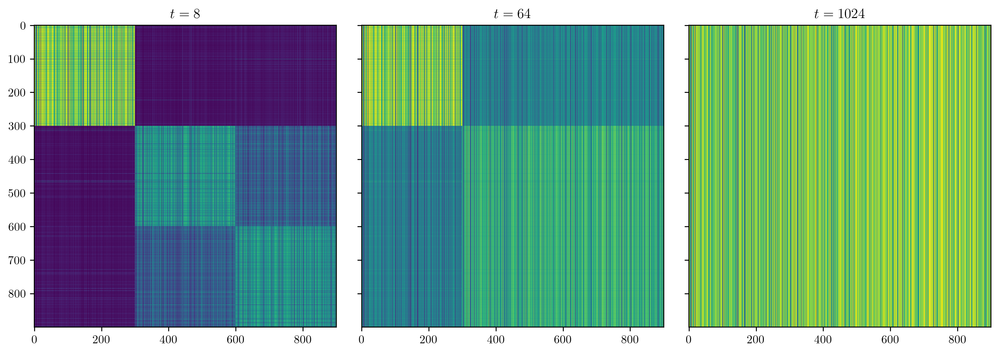

In [12]:
plot_cluster_blocks(X, y, M, [8, 64, 1024])

## Numerical Examples

### Example: Three Blobs

In [13]:
class DiffusionMap:
    """Simple diffusion map with no special weighting on the Markov matrix."""
    def __init__(self, X, s=3, kernel=gaussian_kernel, **kwargs):
        self.M = markov_transition_matrix(X, kernel, **kwargs)
        vals, vecs = la.eig(self.M)
        index = vals.real.argsort()[::-1][:s]
        self.vals = np.minimum(vals[index].real, 1)
        self.vecs = vecs[:,index].real

    def __call__(self, t):
        return self.vals**t * self.vecs

In [14]:
dmap = DiffusionMap(X, 3)
dmap.vals

array([1.        , 0.97614654, 0.84690606])

In [15]:
dmap(0).shape

(900, 3)

In [16]:
def plot_dmap_output(dmap, y, i=1, j=2, ts=(1, 10, 20, 50)):
    fig, axes = plt.subplots(2, 2, figsize=(12,8),
                             sharex=True, sharey=True)
    for t, ax in zip(ts, axes.flatten()):
        D = dmap(t)
        ax.scatter(D[:,i], D[:,j], s=4, c=y, alpha=.5)
        ax.set_title(rf"$t = {t}$")
    plt.show()

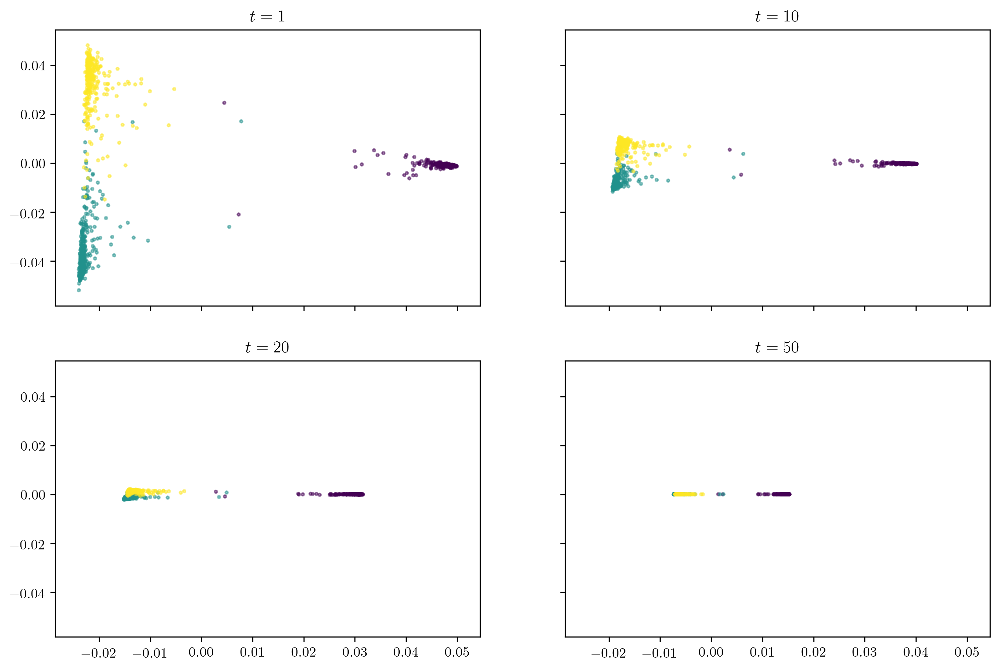

In [17]:
plot_dmap_output(dmap, y)

### Example: Single Blob

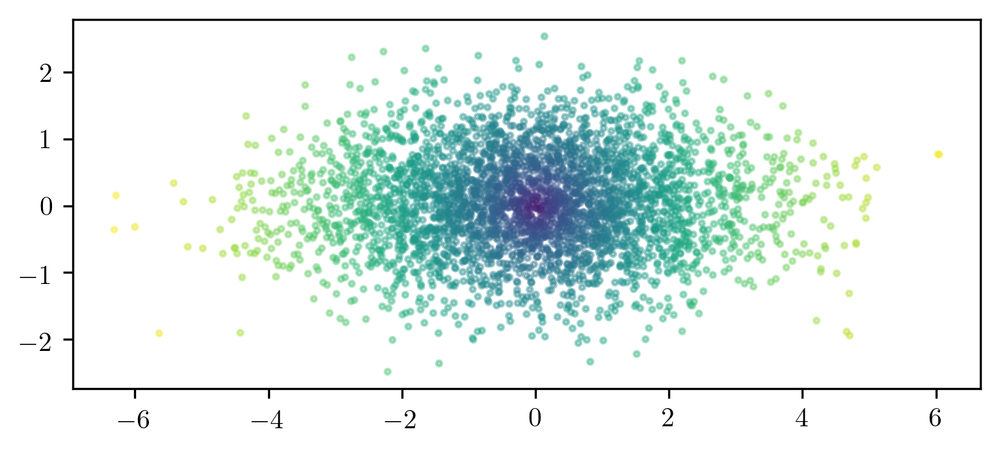

In [18]:
X = np.random.normal(np.zeros(2), scale=np.array([1.75, .75]), size=(3500,2))
color = la.norm(X, axis=1)
color = plt.cm.viridis(np.sqrt(color / color.max()))

plt.scatter(X[:,0], X[:,1], c=color, s=4, alpha=.4)
plt.gca().set_aspect("equal")
plt.show()

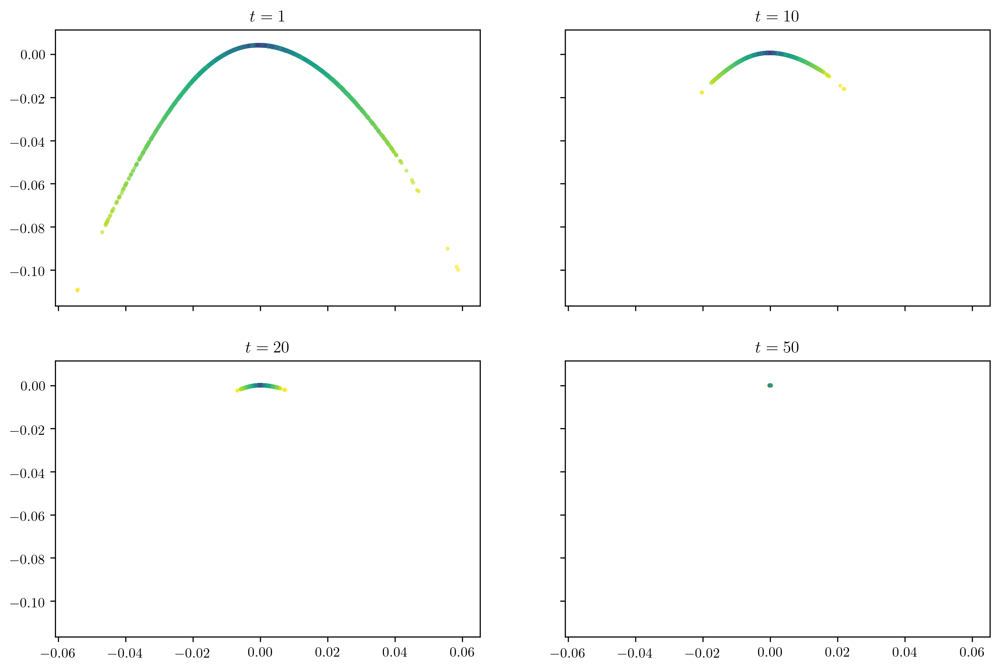

In [19]:
dmap = DiffusionMap(X, 3)
plot_dmap_output(dmap, color)

## Example: Helix Data

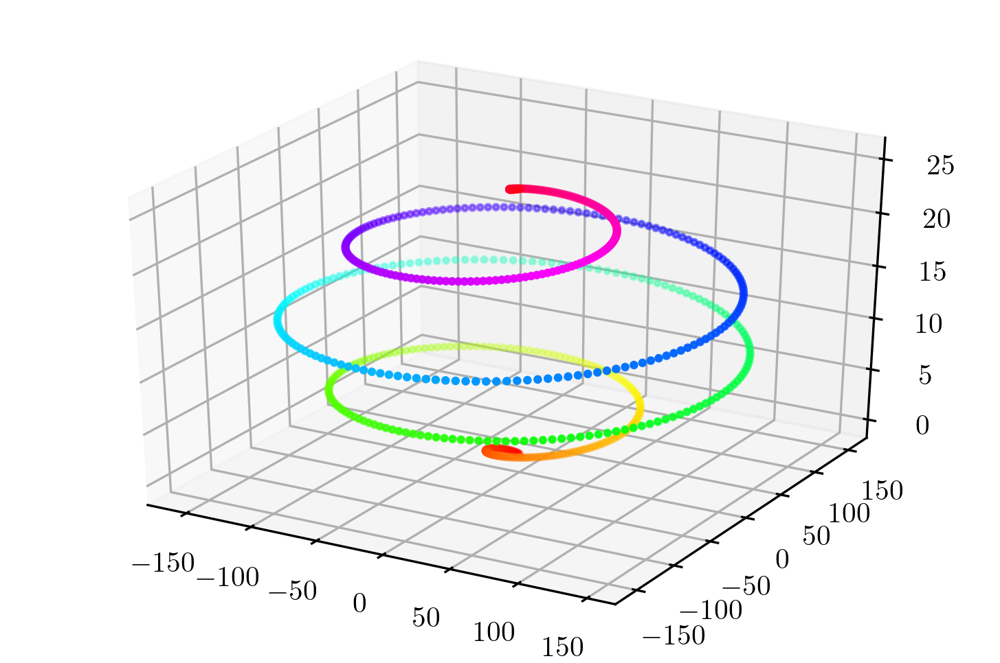

In [20]:
m = 600
t = np.linspace(0, 8*np.pi, m)

X = np.column_stack([
    np.cos(t) * t * (t - 8*np.pi),
    np.sin(t) * t * (t - 8*np.pi),
    t
]) # + np.random.normal(scale=.3, size=(m,3))

y = plt.cm.hsv(np.linspace(0, 1, m))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:,0], X[:,1], X[:,2], '.', s=4, c=y)
plt.show()

In [21]:
def plot_dmap_output_3d(dmap, y, i=1, j=2, k=3, t=1):
    fig = plt.figure(figsize=(6,4))
    ax = fig.add_subplot(111, projection="3d")
    D = dmap(t)
    ax.scatter(D[:,i], D[:,j], D[:,k], s=4, c=y, alpha=.5)
    ax.set_title(rf"$t = {t}$")
    plt.show()

In [22]:
dmap = DiffusionMap(X, 4)
dmap.vals

array([1.        , 1.        , 0.99863789, 0.99730558])

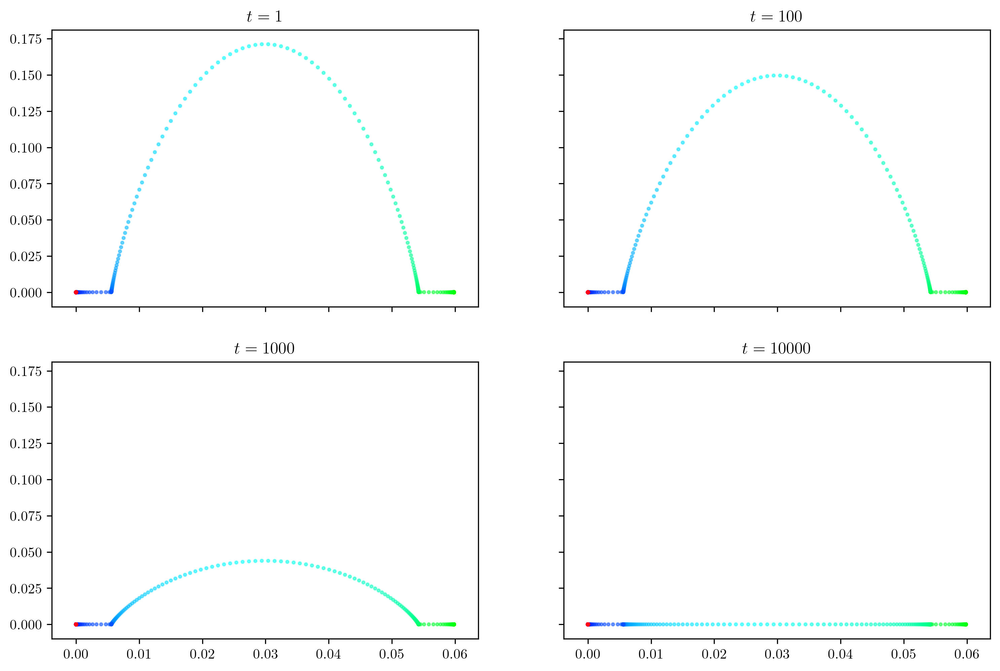

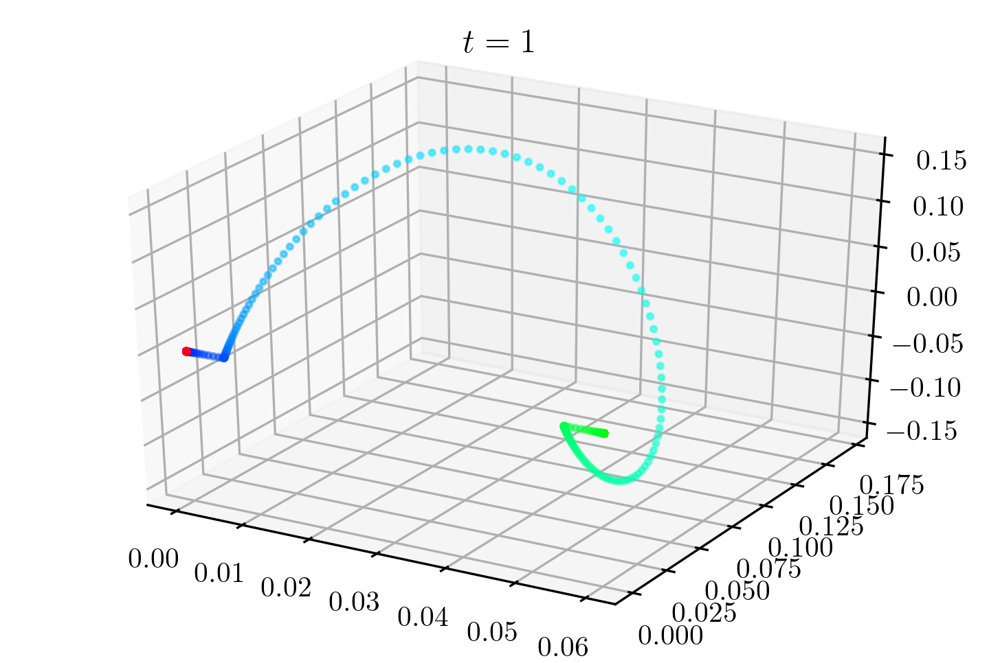

In [23]:
plot_dmap_output(dmap, y, ts=(1, 100, 1000, 10000))
plot_dmap_output_3d(dmap, y)

## Example: Iris Dataset

In [24]:
iris = pydataset.data("iris")
iris.sample(5)

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
81,5.5,2.4,3.8,1.1,versicolor
48,4.6,3.2,1.4,0.2,setosa
84,6.0,2.7,5.1,1.6,versicolor
1,5.1,3.5,1.4,0.2,setosa
20,5.1,3.8,1.5,0.3,setosa


In [25]:
# Extract data and labels from the Iris data set.
iris["Species"] = pd.Categorical(iris["Species"])
X_iris = iris[["Sepal.Length", "Sepal.Width", "Petal.Length", "Petal.Width"]].to_numpy()
y_iris = iris["Species"].cat.codes.to_numpy()

In [26]:
dmap_iris = DiffusionMap(X_iris, s=4)
dmap_iris.vals

array([1.        , 0.99958348, 0.78423806, 0.61610752])

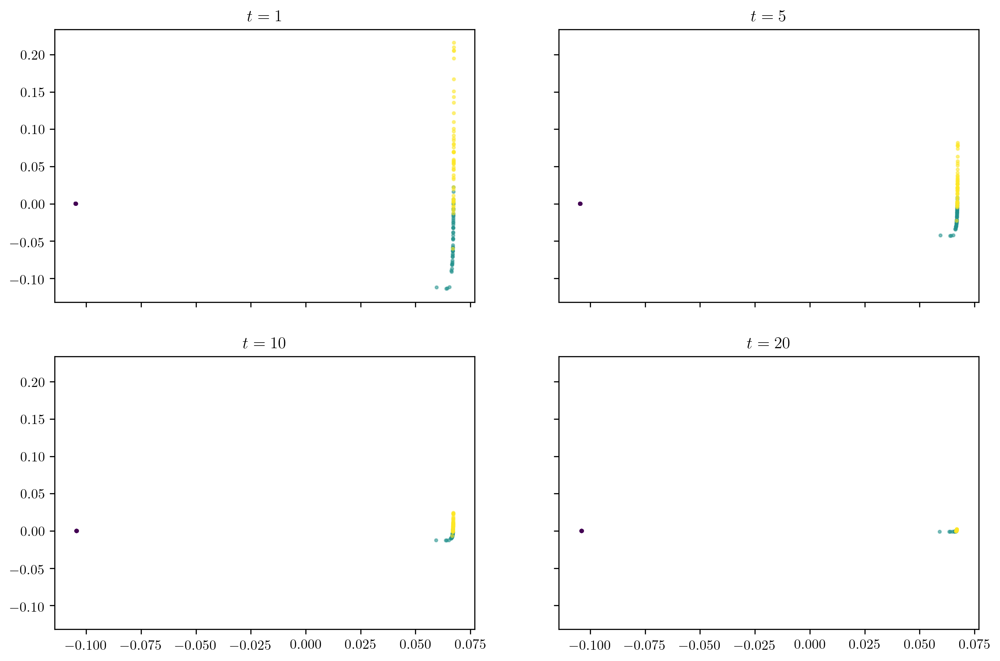

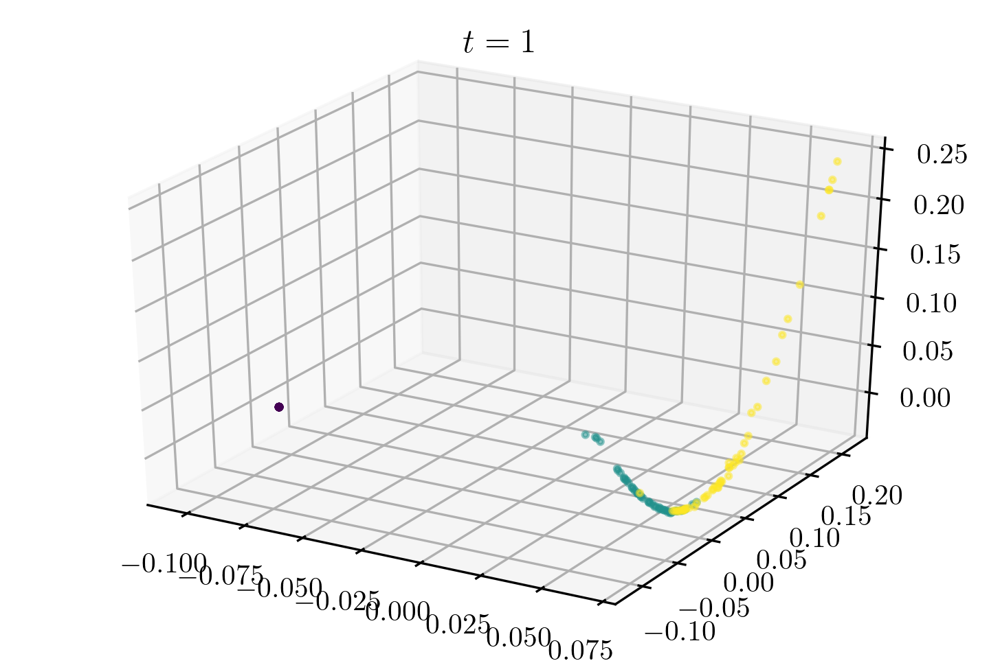

In [27]:
plot_dmap_output(dmap_iris, y_iris, ts=(1, 5, 10, 20))
plot_dmap_output_3d(dmap_iris, y_iris, t=1)